<a href="https://colab.research.google.com/github/huyen-nguyen/hyper-potato/blob/main/notebooks/Interacting_with_CLIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [18]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-5yn4hyqe
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-5yn4hyqe
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done


In [19]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)


Torch version: 2.1.0+cu121


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [20]:
import clip

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [21]:
model, preprocess = clip.load("ViT-B/32")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [22]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7e8367dabac0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [23]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 8 example images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [24]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# images in skimage to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse",
    "coffee": "a cup of coffee on a saucer"
}

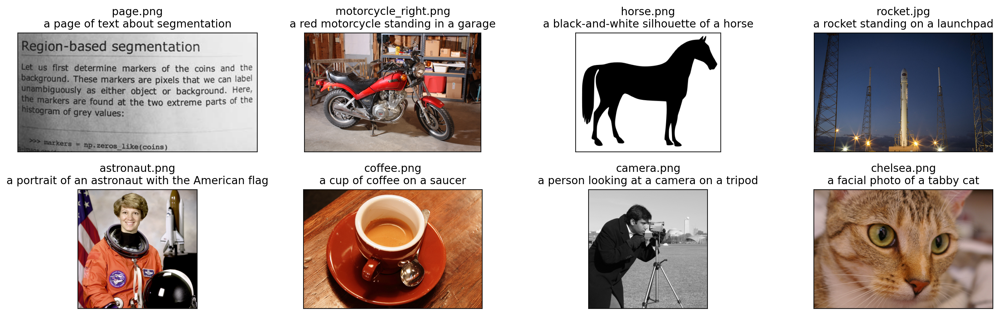

In [92]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

plt.tight_layout()


## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [26]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

In [27]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

In [35]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = image_features.cpu().numpy() @ image_features.cpu().numpy().T

`image_features` is a tensor that present the 512 dimensions of all 8 images

`text_features` is a tensor that present the 512 dimensions of all 8 descriptions

Text(0.5, 1.0, 'Cosine similarity between text and image features')

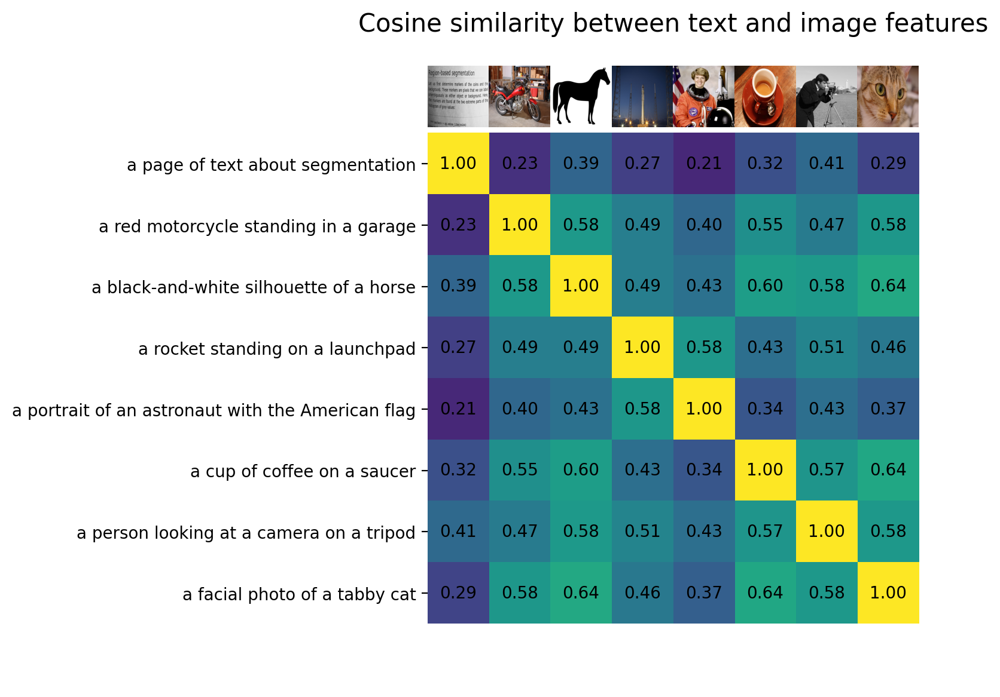

In [111]:
count = len(descriptions)

plt.figure(figsize=(10, 7))
plt.imshow(similarity, vmin=0.1, vmax=1)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=10)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[x, y]:.2f}", ha="center", va="center", size=10)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=15)

## Calculating cosine similarity to a certain image

In [183]:
# choose image number
query_img = 0

In [95]:
similarity2 = image_features[query_img].cpu().numpy() @ image_features.cpu().numpy().T

In [90]:
similarity2

array([0.9999999 , 0.229643  , 0.39251044, 0.27064666, 0.20523497,
       0.31878287, 0.40610194, 0.2851369 ], dtype=float32)

In [104]:
score_list = []

# Create new dictionary of img_no and score

for i, value in enumerate(similarity2):
  this_dict = {'img_no': i, 'score': value}
  score_list.append(this_dict) # append that dict to the list

# Sort the list by the `score` key in descending order
sorted_score = sorted(score_list, key=lambda x: x['score'], reverse=True)

# Print sorted list
sorted_score

[{'img_no': 0, 'score': 0.9999999},
 {'img_no': 6, 'score': 0.40610194},
 {'img_no': 2, 'score': 0.39251044},
 {'img_no': 5, 'score': 0.31878287},
 {'img_no': 7, 'score': 0.2851369},
 {'img_no': 3, 'score': 0.27064666},
 {'img_no': 1, 'score': 0.229643},
 {'img_no': 4, 'score': 0.20523497}]

Query image: 


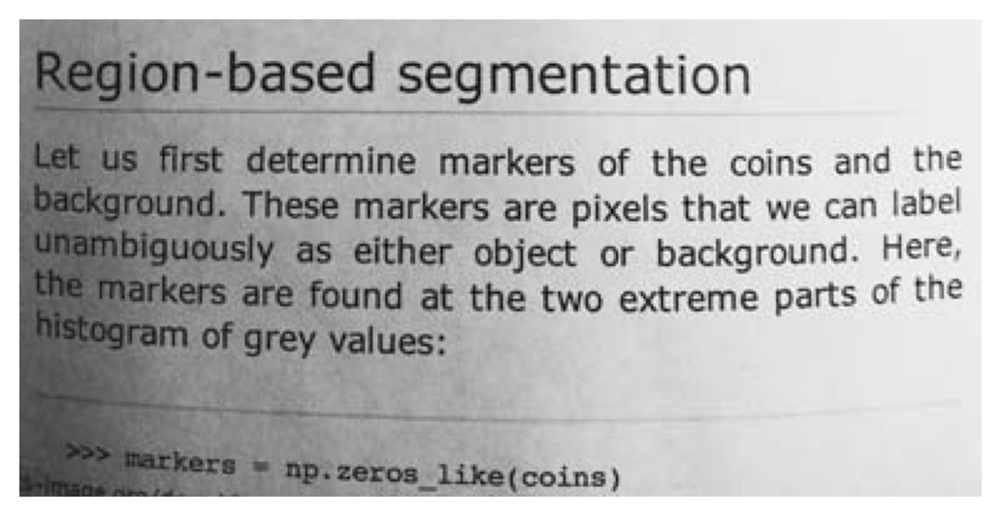

Search result: 


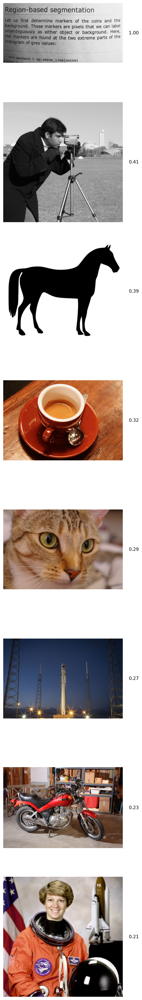

In [224]:
# Print text on the screen
print("Query image: ")
plt.imshow(original_images[query_img])

# Hide the axes
plt.axis('off')

# Show the image
plt.show()

print("Search result: ")

# Determine the number of images
num_images = len(sorted_score)

# Create a figure with subplots
# Adjusting figure size accordingly
fig, axs = plt.subplots(num_images, 1, figsize=(4, num_images * 4))

# If there's only one image, axs won't be an array, so we convert it to one
if num_images == 1:
    axs = [axs]

# Loop through sorted scores, displaying each image and its text
for i, value in enumerate(sorted_score):
    img_no = value['img_no']
    axs[i].imshow(original_images[img_no])
    axs[i].axis('off')  # Turn off the axis
    axs[i].text(1.05, 0.5, f"{sorted_score[i]['score']:.2f}", transform=axs[i].transAxes, va='center')  # Add text

# Adjust padding between subplots
# Here you can modify 'hspace' and 'wspace' as needed
plt.subplots_adjust(hspace=20, wspace=0.2)  # Adjust the spacing here

plt.tight_layout()
plt.show()

Query image: 


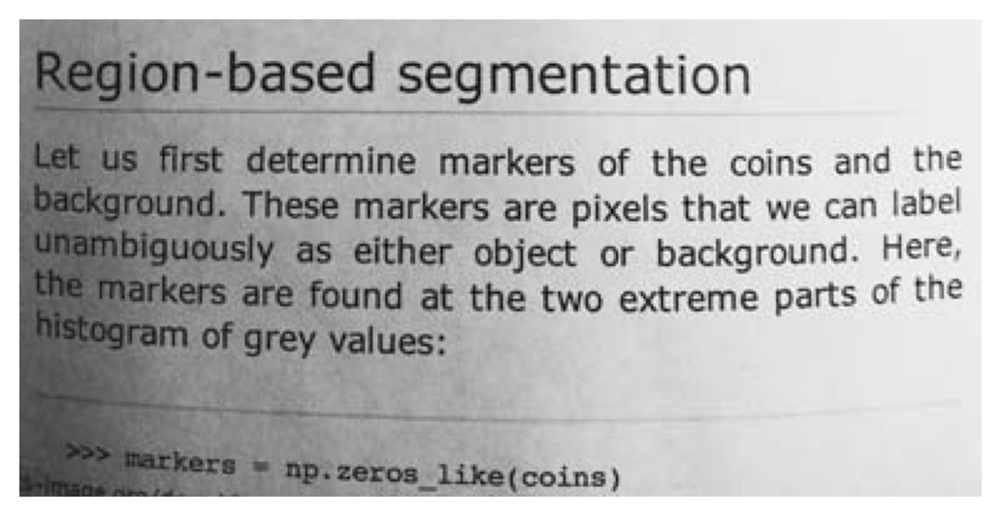


Search result: 


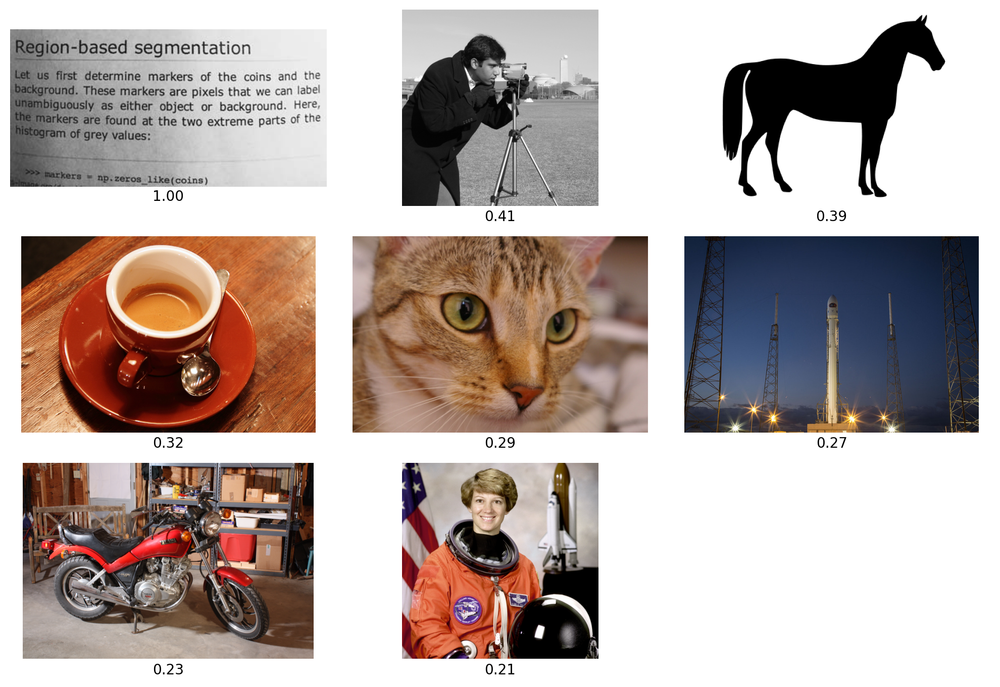

In [235]:
from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 90em; }</style>"))

# Print text on the screen
print("Query image: ")
plt.imshow(original_images[query_img])

# Hide the axes
plt.axis('off')

# Show the image
plt.show()

print("\nSearch result: ")

# Determine the number of images
num_images = len(sorted_score)

# Calculate the number of rows needed for 3 images per row
rows = (num_images + 2) // 3  # +2 for rounding up in integer division

# Create the figure and axes grid
fig, axs = plt.subplots(rows, 3, figsize=(10, 2.3 * rows))

# Flatten axs for easy iteration, in case of a single row/column
axs = axs.flatten()

# Loop through the images and their corresponding axes to display each image
for i in range(rows * 3):
    if i < num_images:
        img_no = sorted_score[i]['img_no']
        # Display an image if the index is within the range of 'images'
        axs[i].imshow(original_images[img_no])
        axs[i].axis('off')  # Turn off the axis
        axs[i].text(0.5, -0.02, f"{sorted_score[i]['score']:.2f}", ha='center', va='top', transform=axs[i].transAxes)  # Add text

    axs[i].axis('off')  # Hide axes regardless of whether there's an image

# Adjust layout
plt.tight_layout()
plt.show()

# Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [30]:
from torchvision.datasets import CIFAR100

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess, download=True)

Files already downloaded and verified


In [31]:
text_descriptions = [f"This is a photo of a {label}" for label in cifar100.classes]
text_tokens = clip.tokenize(text_descriptions).cuda()

In [32]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

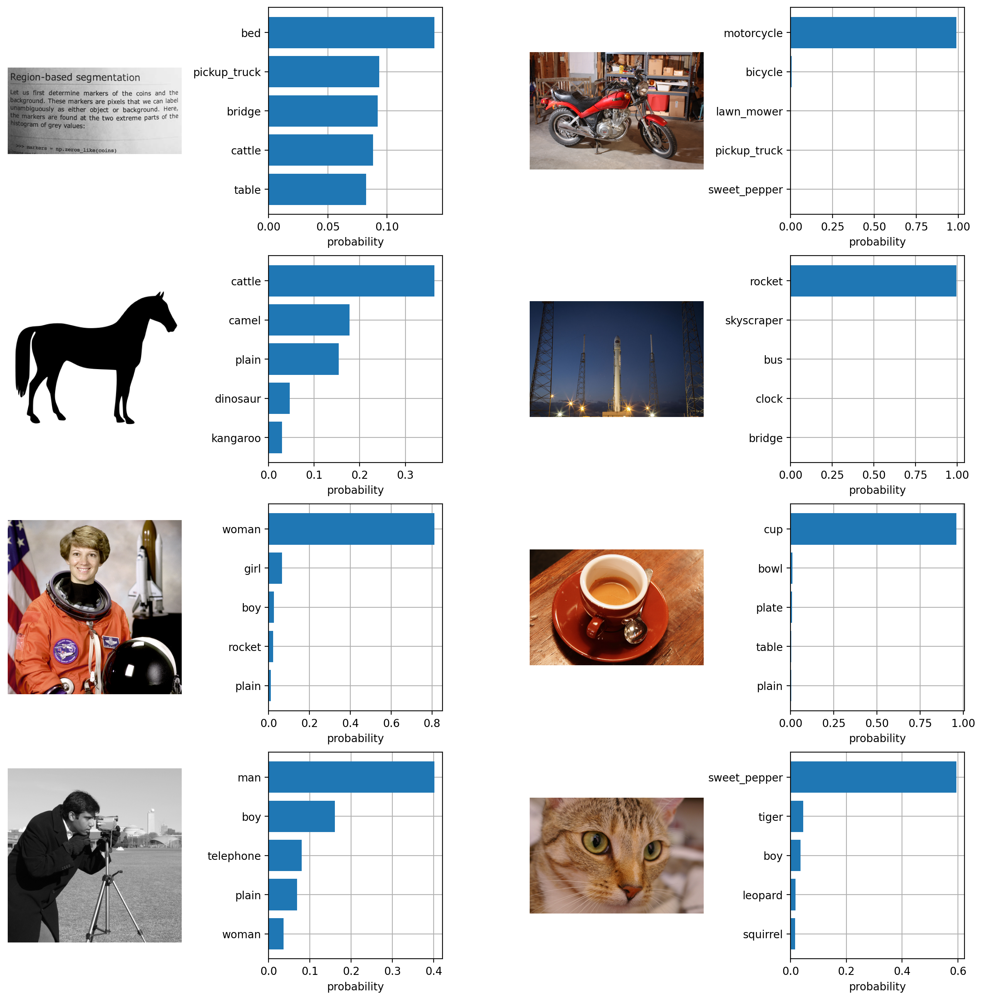

In [33]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()